<a href="https://colab.research.google.com/github/nrodri22/F1_Racing_Final_Position/blob/main/F1_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Formula 1 Analysis & Recommendation on Final Position
In this notebook we looked at 12 different dataset from [Kaggle](https://www.kaggle.com/datasets/cjgdev/formula-1-race-data-19502017) on Formula 1. These dataset were merged into one that was used to analyzed the different factors impact on a driver's final position and score.

---

##Importing modules, dependencies, and data

Importing all modules used in this analysis and mounting our google drive, where the .csv is kept




In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import numpy as np

from datetime import datetime
from matplotlib import pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier, NearestNeighbors
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae
from sklearn.tree import plot_tree, DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn import tree
from itertools import chain, combinations
from matplotlib import rcParams

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
drivers_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/drivers_deleted_columns.csv', encoding = 'latin1')
drivers_standing_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/driverStandings.csv')
qualifying_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/qualifying.csv')
circuits_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/circuits.csv', encoding = 'latin1')
constructorResults_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/constructorResults.csv')
constructorStandings_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/constructorStandings.csv')
constructors_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/constructors.csv')
laptimes_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/lapTimes.csv')
pitStops_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/pitStops.csv')
races_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/races.csv')
results_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/results.csv')
status_df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/Files/status.csv')

##Dropping unneeded columns from each data set.

Dropping columns that seemed irrelevant to our analysis. 

Dropping the 'code' and 'number' columns from drivers dataset.

In [ ]:
drivers_df.drop(['code','number'], axis = 1, inplace = True)
drivers_df.head(1)

,driverId,driverRef,forename,surname,dob,nationality
0,1,hamilton,Lewis,Hamilton,7/1/1985,British


Dropping 'positionText' column from drivers standing dataset.

In [ ]:
drivers_standing_df.drop(['positionText'], axis = 1, inplace = True)
drivers_standing_df.head(1)

In [ ]:
qualifying_df.drop(['number'], axis = 1, inplace = True)
qualifying_df.dropna(inplace = True)

Dropping the 'lat', 'lng', 'url', and 'alt columns from circuits dataset.

In [ ]:
circuits_df.drop(['lat','lng','url','alt'], axis = 1, inplace = True)
circuits_df.head(1)

,circuitId,circuitRef,name,location,country
0,1,albert_park,Albert Park Grand Prix Circuit,Melbourne,Australia


Dropping the 'status' column from constructor results dataset.

In [ ]:
constructorResults_df.drop(['status'], axis = 1, inplace = True)
constructorResults_df.head(1)

,constructorResultsId,raceId,constructorId,points
0,1,18,1,14.0


Dropping the 'positionText' and 'Unnamed: 7' columns from constructor standings dataset.

In [ ]:
constructorStandings_df.drop(['positionText','Unnamed: 7'], axis = 1, inplace = True)
constructorStandings_df.head(1)

,constructorStandingsId,raceId,constructorId,points,position,wins
0,1,18,1,14.0,1,1


Dropping the 'url', 'Unnamed: 5', and 'constructerRef' columns from constructors dataset.

In [ ]:
constructors_df.drop(['url','Unnamed: 5','constructorRef'], axis = 1, inplace = True)
constructors_df.head(1)

,constructorId,name,nationality
0,1,McLaren,British


Dropping the 'time' column from lap times dataset.

In [ ]:
laptimes_df.drop(['time'], axis = 1, inplace = True)

laptimes_df.head(1)

,raceId,driverId,lap,position,milliseconds
0,841,20,1,1,98109


Dropping the 'duration' column from pit stops dataset.

In [ ]:
pitStops_df.drop(['duration'], axis = 1, inplace = True)
pitStops_df.head(1)

,raceId,driverId,stop,lap,time,milliseconds
0,841,153,1,1,17:05:23,26898


Dropping the 'url' column from races dataset.

In [ ]:
races_df.drop(['url'], axis = 1, inplace = True)
races_df.head(1)

,raceId,year,round,circuitId,name,date,time
0,1,2009,1,1,Australian Grand Prix,2009-03-29,06:00:00


Dropping the 'time', 'positionText', and 'number' columns from results dataset.

In [ ]:
results_df.drop(['time','positionText','number'], axis = 1, inplace = True)
results_df.head(5)

,resultId,raceId,driverId,constructorId,grid,position,positionOrder,points,laps,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId
0,1,18,1,1,1,1.0,1,10.0,58,5690616.0,39.0,2.0,01:27.5,218.3,1
1,2,18,2,2,5,2.0,2,8.0,58,5696094.0,41.0,3.0,01:27.7,217.586,1
2,3,18,3,3,7,3.0,3,6.0,58,5698779.0,41.0,5.0,01:28.1,216.719,1
3,4,18,4,4,11,4.0,4,5.0,58,5707797.0,58.0,7.0,01:28.6,215.464,1
4,5,18,5,1,3,5.0,5,4.0,58,5708630.0,43.0,1.0,01:27.4,218.385,1


In [ ]:
status_df.head(1)

,statusId,status
0,1,Finished


##Renaming Columns and Merging Datasets

####Renaming the column names in each dataset for the final dataset and beginning merging of datsets.

Renaming columns in both races and lap times data sets.

In [ ]:
races_df.shape
races_df.rename(columns={"name": "race_name", 'time' : 'race_time'}, inplace = True)
races_df.columns

Index(['raceId', 'year', 'round', 'circuitId', 'race_name', 'date',
       'race_time'],
      dtype='object')

In [ ]:
laptimes_df.isna().sum()
laptimes_df.rename(columns={"time": "laptime", 'position':'lap_position'}, inplace = True)
laptimes_df.head(1)

,raceId,driverId,lap,lap_position,milliseconds
0,841,20,1,1,98109


Merging data sets races and laptimes into one.

In [ ]:
one_df = pd.merge(races_df, laptimes_df, on = ['raceId'])

Renaming columns in circuits datset.

In [ ]:
circuits_df.rename(columns={"name": "circuit_name"}, inplace = True)
circuits_df.columns

Index(['circuitId', 'circuitRef', 'circuit_name', 'location', 'country'], dtype='object')

Merging data sets circuits and the recent merged datset, one.

In [ ]:
two_df = pd.merge(one_df, circuits_df, on = 'circuitId')

Renaming columns in results dataset.

In [ ]:
results_df.rename(columns={"time": "result_time",'laps': 'total_laps','milliseconds':'result_milliseconds','position':'final_position', 'points':'result_points'}, inplace = True)


Merging data sets results and the recent merged datset, two.

In [ ]:
three_df = pd.merge(two_df, results_df, on = ['raceId', 'driverId'])
len(three_df.columns)

28

In [ ]:
drivers_df.columns

Index(['driverId', 'driverRef', 'forename', 'surname', 'dob', 'nationality'], dtype='object')

Merging data sets drivers and the recent merged datset, three.


In [ ]:
four_df = pd.merge(three_df, drivers_df, on = 'driverId')
four_df.columns

Index(['raceId', 'year', 'round', 'circuitId', 'race_name', 'date',
       'race_time', 'driverId', 'lap', 'lap_position', 'milliseconds',
       'circuitRef', 'circuit_name', 'location', 'country', 'resultId',
       'constructorId', 'grid', 'final_position', 'positionOrder',
       'result_points', 'total_laps', 'result_milliseconds', 'fastestLap',
       'rank', 'fastestLapTime', 'fastestLapSpeed', 'statusId', 'driverRef',
       'forename', 'surname', 'dob', 'nationality'],
      dtype='object')

In [ ]:
drivers_standing_df.columns

Index(['driverStandingsId', 'raceId', 'driverId', 'points', 'position',
       'wins'],
      dtype='object')

Merging data sets drivers standing and the recent merged datset, four.


In [ ]:
five_df = pd.merge(four_df, drivers_standing_df, on = ['raceId','driverId'])
five_df.shape

(419989, 37)

Renaming the columns in the datset pit stops and qualifying.

In [ ]:
pitStops_df.rename(columns={"time": "pitstop_time",'milliseconds':'millisecond_pitstop','duration':'pit_duration','stop' : 'pitstop'}, inplace = True)

In [ ]:
# six_df = pd.merge(five_df, pitStops_df, how = 'left', on = ['raceId','driverId','lap'])
# six_df.rename(columns={'milliseconds':'lap_milliseconds'}, inplace = True)
# six_df.shape

In [ ]:
qualifying_df.rename(columns={'position':'qual_position'}, inplace = True)
qualifying_df.columns

Index(['qualifyId', 'raceId', 'driverId', 'constructorId', 'qual_position',
       'q1', 'q2', 'q3'],
      dtype='object')

In [ ]:
#  results, laptimes, circuits, races, drivers, driversStandings, pitStops, qualifying
seven_df = pd.merge(five_df, qualifying_df, on = ['raceId','driverId','constructorId'])
seven_df.rename(columns={'milliseconds':'lap_milliseconds'}, inplace = True)

seven_df.shape

(118557, 42)

In [ ]:
constructors_df.rename(columns={'name':'constructor_name','nationality':'constructor_nationality'}, inplace = True)
constructors_df.columns

Index(['constructorId', 'constructor_name', 'constructor_nationality'], dtype='object')

In [ ]:
eight_df = pd.merge(seven_df, constructors_df, on = ['constructorId'])
eight_df.columns

Index(['raceId', 'year', 'round', 'circuitId', 'race_name', 'date',
       'race_time', 'driverId', 'lap', 'lap_position', 'lap_milliseconds',
       'circuitRef', 'circuit_name', 'location', 'country', 'resultId',
       'constructorId', 'grid', 'final_position', 'positionOrder',
       'result_points', 'total_laps', 'result_milliseconds', 'fastestLap',
       'rank', 'fastestLapTime', 'fastestLapSpeed', 'statusId', 'driverRef',
       'forename', 'surname', 'dob', 'nationality', 'driverStandingsId',
       'points', 'position', 'wins', 'qualifyId', 'qual_position', 'q1', 'q2',
       'q3', 'constructor_name', 'constructor_nationality'],
      dtype='object')

In [ ]:
constructorResults_df.rename(columns={'points':'constructor_points','status':'constructor_status'}, inplace = True)
constructorResults_df.columns

Index(['constructorResultsId', 'raceId', 'constructorId',
       'constructor_points'],
      dtype='object')

In [ ]:
nine_df = pd.merge(eight_df, constructorResults_df, on = ['raceId','constructorId'])
nine_df.columns

Index(['raceId', 'year', 'round', 'circuitId', 'race_name', 'date',
       'race_time', 'driverId', 'lap', 'lap_position', 'lap_milliseconds',
       'circuitRef', 'circuit_name', 'location', 'country', 'resultId',
       'constructorId', 'grid', 'final_position', 'positionOrder',
       'result_points', 'total_laps', 'result_milliseconds', 'fastestLap',
       'rank', 'fastestLapTime', 'fastestLapSpeed', 'statusId', 'driverRef',
       'forename', 'surname', 'dob', 'nationality', 'driverStandingsId',
       'points', 'position', 'wins', 'qualifyId', 'qual_position', 'q1', 'q2',
       'q3', 'constructor_name', 'constructor_nationality',
       'constructorResultsId', 'constructor_points'],
      dtype='object')

In [ ]:
constructorStandings_df.rename(columns={'points':'constructorStanding_points','position':'constructorStanding_position','wins':'constructorStanding_wins'}, inplace = True)
constructorStandings_df.columns

Index(['constructorStandingsId', 'raceId', 'constructorId',
       'constructorStanding_points', 'constructorStanding_position',
       'constructorStanding_wins'],
      dtype='object')

In [ ]:
ten_df = pd.merge(nine_df, constructorStandings_df, on = ['raceId','constructorId'])
ten_df.columns

Index(['raceId', 'year', 'round', 'circuitId', 'race_name', 'date',
       'race_time', 'driverId', 'lap', 'lap_position', 'lap_milliseconds',
       'circuitRef', 'circuit_name', 'location', 'country', 'resultId',
       'constructorId', 'grid', 'final_position', 'positionOrder',
       'result_points', 'total_laps', 'result_milliseconds', 'fastestLap',
       'rank', 'fastestLapTime', 'fastestLapSpeed', 'statusId', 'driverRef',
       'forename', 'surname', 'dob', 'nationality', 'driverStandingsId',
       'points', 'position', 'wins', 'qualifyId', 'qual_position', 'q1', 'q2',
       'q3', 'constructor_name', 'constructor_nationality',
       'constructorResultsId', 'constructor_points', 'constructorStandingsId',
       'constructorStanding_points', 'constructorStanding_position',
       'constructorStanding_wins'],
      dtype='object')


####Final data with all combined 12 data sets is then converted into a csv file for analysis.

In [ ]:
#Final data set merging. 
final_df = pd.merge(ten_df, status_df, on = ['statusId'])
final_df.isna().sum()

In [ ]:
#Final data set converted into a csv file.
# final_df.to_csv('combined_data.csv')

#Final Combined Data Set Cleaning and Data Engineering

------

#Data Features Explanations

`raceId`: Foreign key link to races table\
`year`: Year linked to seasons\
`round`: Round number\
`circuitId`:  Link to circuits approved by FIA\
`race_name`: Race name\
`date`:Race date\
`race_time`: Race start time\
`driverId`: Foreign key link to driver\
`lap`: Which lap it is on the race\
`lap_position`: Lap position a driver is in for that lap\
`lap_milliseconds`: Lap time in milliseconds\
`circuitRef`: Circuit name abbreviation\
`circuit_name`: Name of the circuit\
`location`: Location of the circuit\
`country`: Country a race is placed\
`grid`: Determined order of car placement at the start of the race \
`final_position`: The position in which a driver finished the race\
`result_points`: Driver points for season\
`total_laps`: The number of laps in a race\
`result_milliseconds`: Final race time per driver in milliseconds\
`fastestLap`: Identifies which lap number was the driver's fastest for the race\
`rank`: A driver's rank based on performance\
`fastestLapTime`: Lap time in milliseconds for the driver's fastest lap in the race\
`fastestLapSpeed`: Lap speed in kilometers for the driver's fastest lap in the race\
`driverRef`: Unique driver\
`forename`: Driver forename\
`surname`: Driver surname\
`dob`: Driver date of birth\
`nationality`: Driver nationality\
`points`: Constructor points for race\
`position`: Constructor standings position\
`wins`: Season win count\
`qualifyId`: Primary key\
`qual_position`: Qualifying position\
`q1`: First round of qualifying lap time (where the 5 slowest drivers are eliminated lap time)\
`q2`: Second round of qualifying lap time \
`q3`: Last of the drivers compete in this third and final qualifying round lap time\
`constructor_name`: Constructor is the owner of the engine and team\
`constructor_nationality`: Nationality of each Constructor\
`constructor_points`: Constructor points earned from a race from both races they own.\
`constructorStanding_points`: Total points a constructor has in comparison to other constructors\
`constructorStanding_position`: Constructors position (ex. first place position) against other constructors\
`constructorStanding_wins`: Total wins a constructor has\
`status`: Driver status in a race(disqualyfied/finished/collision/engine,ect)



Importing the path of the combined data set.

In [ ]:
df1 = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/combined_data (1).csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (27) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
df1.head(3)

,Unnamed: 0,raceId,year,round,circuitId,race_name,date,race_time,driverId,lap,...,q3,constructor_name,constructor_nationality,constructorResultsId,constructor_points,constructorStandingsId,constructorStanding_points,constructorStanding_position,constructorStanding_wins,status
0,0,18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,1,...,1:26.714,McLaren,British,1,14.0,1,14.0,1,1,Finished
1,1,18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,2,...,1:26.714,McLaren,British,1,14.0,1,14.0,1,1,Finished
2,2,18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,3,...,1:26.714,McLaren,British,1,14.0,1,14.0,1,1,Finished


Chekcing for any missing values in the dataset.

In [ ]:
df1.isna().sum()

Unnamed: 0                          0
raceId                              0
year                                0
round                               0
circuitId                           0
race_name                           0
date                                0
race_time                           0
driverId                            0
lap                                 0
lap_position                        0
lap_milliseconds                    0
circuitRef                          0
circuit_name                        0
location                            0
country                             0
resultId                            0
constructorId                       0
grid                                0
final_position                   6450
positionOrder                       0
result_points                       0
total_laps                          0
result_milliseconds             23887
fastestLap                        584
rank                               57
fastestLapTi

In [ ]:
df1.shape

(118668, 52)

In [ ]:
df1.columns

Index(['Unnamed: 0', 'raceId', 'year', 'round', 'circuitId', 'race_name',
       'date', 'race_time', 'driverId', 'lap', 'lap_position',
       'lap_milliseconds', 'circuitRef', 'circuit_name', 'location', 'country',
       'resultId', 'constructorId', 'grid', 'final_position', 'positionOrder',
       'result_points', 'total_laps', 'result_milliseconds', 'fastestLap',
       'rank', 'fastestLapTime', 'fastestLapSpeed', 'statusId', 'driverRef',
       'forename', 'surname', 'dob', 'nationality', 'driverStandingsId',
       'points', 'position', 'wins', 'qualifyId', 'qual_position', 'q1', 'q2',
       'q3', 'constructor_name', 'constructor_nationality',
       'constructorResultsId', 'constructor_points', 'constructorStandingsId',
       'constructorStanding_points', 'constructorStanding_position',
       'constructorStanding_wins', 'status'],
      dtype='object')

##Data Engineering two new columns to include in our dataset.

Created column 'age' for when a driver was born and 'is_home' for what country the driver belong to.

Function that finds the age of a driver based on the month and day in the date column.

In [ ]:
from datetime import datetime, date
# This function converts given date to age
def age(born):
  born = datetime.strptime(born, "%d/%m/%Y").date()
  today = date.today()
  return today.year - born.year - ((today.month,
                  today.day) < (born.month,
                          born.day))
df1['age'] = df1['dob'].apply(age)


Creating a dictionary with the key as the country and the value as the drivers nationality.

In [ ]:
country_nat = {'Australia': 'Austrian','Malaysia': 'Malaysian', 'China':'Chinese','Bahrain':'Bahraini','Spain':'Spanish','Monaco':'Monacan',
            'Turkey':'Turkish','UK':'British','Germany':'German','Hungary':'Hungarian','Belgium':'Belgian','Italy':'Italian',
            'Singapore':'Singaporean','Japan':'Japanese','Brazil':'Brazilian','UAE':'Emirati','Canada':'Canadian',
            'France':'French','USA':'American','Korea':'Korean','India': 'Indian','Austria':'Austrian','Russia':'Russian','Mexico':'Mexican','Azerbaijan':'Azeri'}

Creating the column 'is_home' using a function that maps the nationality of a driver and the country they are from. This then allows us to create the column 'nationality' for each driver using the country dictionary created. 

In [ ]:
IsHome = []
for i in range(0,len(df1)):
  check_nat = country_nat[df1.iloc[i]['country']]
  driver_nat = df1.iloc[i]['nationality']
  if driver_nat == check_nat:
    IsHome.append(True)
  else:
    IsHome.append(False)

In [ ]:
df1['is_home'] = IsHome

Checking to ensure the addition of the new columns 'age' and 'is_home'.

In [ ]:
df1.columns

Index(['Unnamed: 0', 'raceId', 'year', 'round', 'circuitId', 'race_name',
       'date', 'race_time', 'driverId', 'lap', 'lap_position',
       'lap_milliseconds', 'circuitRef', 'circuit_name', 'location', 'country',
       'resultId', 'constructorId', 'grid', 'final_position', 'positionOrder',
       'result_points', 'total_laps', 'result_milliseconds', 'fastestLap',
       'rank', 'fastestLapTime', 'fastestLapSpeed', 'statusId', 'driverRef',
       'forename', 'surname', 'dob', 'nationality', 'driverStandingsId',
       'points', 'position', 'wins', 'qualifyId', 'qual_position', 'q1', 'q2',
       'q3', 'constructor_name', 'constructor_nationality',
       'constructorResultsId', 'constructor_points', 'constructorStandingsId',
       'constructorStanding_points', 'constructorStanding_position',
       'constructorStanding_wins', 'status', 'age', 'is_home'],
      dtype='object')

In [ ]:
df1.head(5)

,Unnamed: 0,raceId,year,round,circuitId,race_name,date,race_time,driverId,lap,...,constructor_nationality,constructorResultsId,constructor_points,constructorStandingsId,constructorStanding_points,constructorStanding_position,constructorStanding_wins,status,age,is_home
0,0,18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,1,...,British,1,14.0,1,14.0,1,1,Finished,37,False
1,1,18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,2,...,British,1,14.0,1,14.0,1,1,Finished,37,False
2,2,18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,3,...,British,1,14.0,1,14.0,1,1,Finished,37,False
3,3,18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,4,...,British,1,14.0,1,14.0,1,1,Finished,37,False
4,4,18,2008,1,1,Australian Grand Prix,2008-03-16,04:30:00,1,5,...,British,1,14.0,1,14.0,1,1,Finished,37,False


Label encoding both new columns 'age' and 'is_home' to include in our combined csv file dataset.

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df1['is_home'] = le.fit_transform(df1['is_home'])
df1['age'] = le.fit_transform(df1['age'])

#Uploading new combined clean data set for analysis

Importing the path of the combined data set.

In [ ]:
df = pd.read_csv('/content/drive/Shareddrives/Proj3_F1Racing/cleaned_combined_data.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (28) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
df.head(5)

,Unnamed: 0,Unnamed: 0.1,raceId,year,round,circuitId,race_name,date,race_time,driverId,...,q3,constructor_name,constructor_nationality,constructorResultsId,constructor_points,constructorStandingsId,constructorStanding_points,constructorStanding_position,constructorStanding_wins,status
0,0,0,18,2008,1,1,1,35,1,1,...,86.714,7,2,1,14.0,1,14.0,1,1,19
1,1,1,18,2008,1,1,1,35,1,1,...,86.714,7,2,1,14.0,1,14.0,1,1,19
2,2,2,18,2008,1,1,1,35,1,1,...,86.714,7,2,1,14.0,1,14.0,1,1,19
3,3,3,18,2008,1,1,1,35,1,1,...,86.714,7,2,1,14.0,1,14.0,1,1,19
4,4,4,18,2008,1,1,1,35,1,1,...,86.714,7,2,1,14.0,1,14.0,1,1,19


In [ ]:
df.shape

(118668, 53)

In [ ]:
df.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'raceId', 'year', 'round', 'circuitId',
       'race_name', 'date', 'race_time', 'driverId', 'lap', 'lap_position',
       'lap_milliseconds', 'circuitRef', 'circuit_name', 'location', 'country',
       'resultId', 'constructorId', 'grid', 'final_position', 'positionOrder',
       'result_points', 'total_laps', 'result_milliseconds', 'fastestLap',
       'rank', 'fastestLapTime', 'fastestLapSpeed', 'statusId', 'driverRef',
       'forename', 'surname', 'dob', 'nationality', 'driverStandingsId',
       'points', 'position', 'wins', 'qualifyId', 'qual_position', 'q1', 'q2',
       'q3', 'constructor_name', 'constructor_nationality',
       'constructorResultsId', 'constructor_points', 'constructorStandingsId',
       'constructorStanding_points', 'constructorStanding_position',
       'constructorStanding_wins', 'status'],
      dtype='object')

##Converting Time Format

Creating a function that converts the time format in some of the columns from minutes to milliseconds for better analysis.

In [ ]:
pd.to_datetime('34:50.601', format='%M:%S.%f')

Timestamp('1900-01-01 00:34:50.601000')

In [ ]:
def convert_time(row):
  row = str(row)
  row = row.strip('+')
  row = row.strip('sec')
  total = 0
  spt = row.split(':') # [m, s.ms]
  sec = float(spt[0]) * 60
  total = sec + float(spt[-1])
  return float(total)

Converting the times in columns 'q1', 'q2', 'q3', and 'fastestLapTime'.

In [ ]:
df['q1']=df['q1'].apply(convert_time)
df['q2']=df['q2'].apply(convert_time)
df['q3']=df['q3'].apply(convert_time)
df['fastestLapTime']=df['fastestLapTime'].apply(convert_time)

In [ ]:
df.dtypes

Unnamed: 0                        int64
Unnamed: 0.1                      int64
raceId                            int64
year                              int64
round                             int64
circuitId                         int64
race_name                         int64
date                              int64
race_time                         int64
driverId                          int64
lap                               int64
lap_position                      int64
lap_milliseconds                  int64
circuitRef                        int64
circuit_name                      int64
location                          int64
country                           int64
resultId                          int64
constructorId                     int64
grid                              int64
final_position                  float64
positionOrder                     int64
result_points                   float64
total_laps                        int64
result_milliseconds             float64


##Label Encoding

Label Encoding all non integer or float columns for analysis.

In [ ]:
objList = df.select_dtypes(include = 'object').columns
objList

Index(['fastestLapSpeed'], dtype='object')

In [ ]:
objList=objList.drop(['fastestLapSpeed'])

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

df[objList] = df[objList].apply(le.fit_transform)

Checking to ensure all columns were label encoded, with the exception of fastestLapSpeed whose format was not change, thus unable to label encode.

In [ ]:
df.dtypes

Unnamed: 0                        int64
Unnamed: 0.1                      int64
raceId                            int64
year                              int64
round                             int64
circuitId                         int64
race_name                         int64
date                              int64
race_time                         int64
driverId                          int64
lap                               int64
lap_position                      int64
lap_milliseconds                  int64
circuitRef                        int64
circuit_name                      int64
location                          int64
country                           int64
resultId                          int64
constructorId                     int64
grid                              int64
final_position                  float64
positionOrder                     int64
result_points                   float64
total_laps                        int64
result_milliseconds             float64


In [ ]:
#df.to_csv('cleaned_combined_data.csv')

Adding column 'age' and 'is_home' from the previous dataset into the new uploaded combined cleaned data set. 

In [ ]:
df['age'] = df1['age']
df['is_home'] = df1['is_home']

Checking the columns to ensure the columns are in the dataset.

In [ ]:
df.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'raceId', 'year', 'round', 'circuitId',
       'race_name', 'date', 'race_time', 'driverId', 'lap', 'lap_position',
       'lap_milliseconds', 'circuitRef', 'circuit_name', 'location', 'country',
       'resultId', 'constructorId', 'grid', 'final_position', 'positionOrder',
       'result_points', 'total_laps', 'result_milliseconds', 'fastestLap',
       'rank', 'fastestLapTime', 'fastestLapSpeed', 'statusId', 'driverRef',
       'forename', 'surname', 'dob', 'nationality', 'driverStandingsId',
       'points', 'position', 'wins', 'qualifyId', 'qual_position', 'q1', 'q2',
       'q3', 'constructor_name', 'constructor_nationality',
       'constructorResultsId', 'constructor_points', 'constructorStandingsId',
       'constructorStanding_points', 'constructorStanding_position',
       'constructorStanding_wins', 'status', 'age', 'is_home'],
      dtype='object')

Dropping unnecessary index columns.

In [ ]:
df = df.drop(columns = ['Unnamed: 0', 'Unnamed: 0.1'], axis = 1)

Checking for any missing values and dropping them.

In [ ]:
df.isna().sum()

raceId                              0
year                                0
round                               0
circuitId                           0
race_name                           0
date                                0
race_time                           0
driverId                            0
lap                                 0
lap_position                        0
lap_milliseconds                    0
circuitRef                          0
circuit_name                        0
location                            0
country                             0
resultId                            0
constructorId                       0
grid                                0
final_position                   6450
positionOrder                       0
result_points                       0
total_laps                          0
result_milliseconds             23887
fastestLap                        584
rank                               57
fastestLapTime                    584
fastestLapSp

In [ ]:
df = df.dropna(how='any')

Checking to ensure there are no missing values in our dataset. 

In [ ]:
df.isna().sum()

raceId                          0
year                            0
round                           0
circuitId                       0
race_name                       0
date                            0
race_time                       0
driverId                        0
lap                             0
lap_position                    0
lap_milliseconds                0
circuitRef                      0
circuit_name                    0
location                        0
country                         0
resultId                        0
constructorId                   0
grid                            0
final_position                  0
positionOrder                   0
result_points                   0
total_laps                      0
result_milliseconds             0
fastestLap                      0
rank                            0
fastestLapTime                  0
fastestLapSpeed                 0
statusId                        0
driverRef                       0
forename      

In [ ]:
df.head(5)


,raceId,year,round,circuitId,race_name,date,race_time,driverId,lap,lap_position,...,constructor_nationality,constructorResultsId,constructor_points,constructorStandingsId,constructorStanding_points,constructorStanding_position,constructorStanding_wins,status,age,is_home
0,18,2008,1,1,1,35,1,1,1,1,...,2,1,14.0,1,14.0,1,1,19,12,0
1,18,2008,1,1,1,35,1,1,2,1,...,2,1,14.0,1,14.0,1,1,19,12,0
2,18,2008,1,1,1,35,1,1,3,1,...,2,1,14.0,1,14.0,1,1,19,12,0
3,18,2008,1,1,1,35,1,1,4,1,...,2,1,14.0,1,14.0,1,1,19,12,0
4,18,2008,1,1,1,35,1,1,5,1,...,2,1,14.0,1,14.0,1,1,19,12,0


#Final Combined Data Set Analysis

-----


##Plots Analyzing Final Position. 

Created a plot on the average final position based on a drivers home country. The lower the average final position indicates a good position for a driver. This graph shows that those racing in their homeland have a better chance on a good final position than those who are racing away from home.  

In [ ]:
df.drop_duplicates(subset=['raceId'], inplace=True)

In [ ]:
homeRacers = df[df['is_home'] == True]

In [ ]:
visitorRacers = df[df['is_home'] == False]

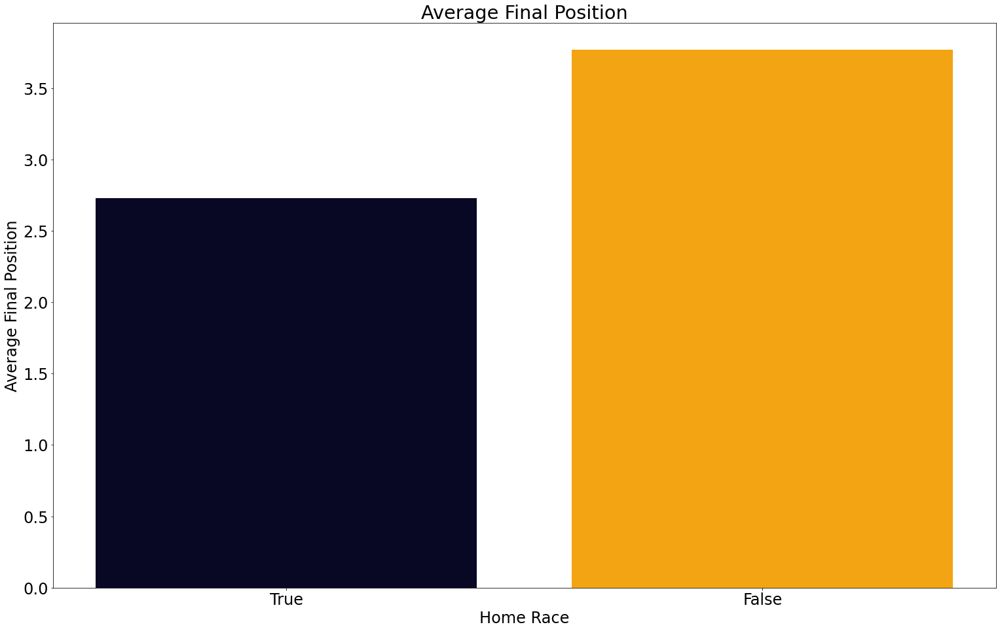

In [ ]:
plt.rcParams.update({'font.size': 24})
master_figsize = (20, 12)

fig = plt.figure(figsize=master_figsize)
ax = fig.add_axes([0,0,1,1])

plt.xlabel('Home Race')
plt.ylabel('Average Final Position')
plt.title('Average Final Position')
# plt.xticks(fontsize=12) 
# plt.yticks(fontsize=12) 


isHomeList = ['True','False']
avgfinalpos = [homeRacers['final_position'].mean(), visitorRacers['final_position'].mean()]
ax.bar(isHomeList,avgfinalpos,color=['#080724', '#f2a413'])
plt.show()

Created a plot by grouping 'nationality' with the final position that shows the effects of a driver racing in their home country. The lower average final position country drivers tend to win on average more than the counter nationalities. Thus, British drivers have the best average final position.

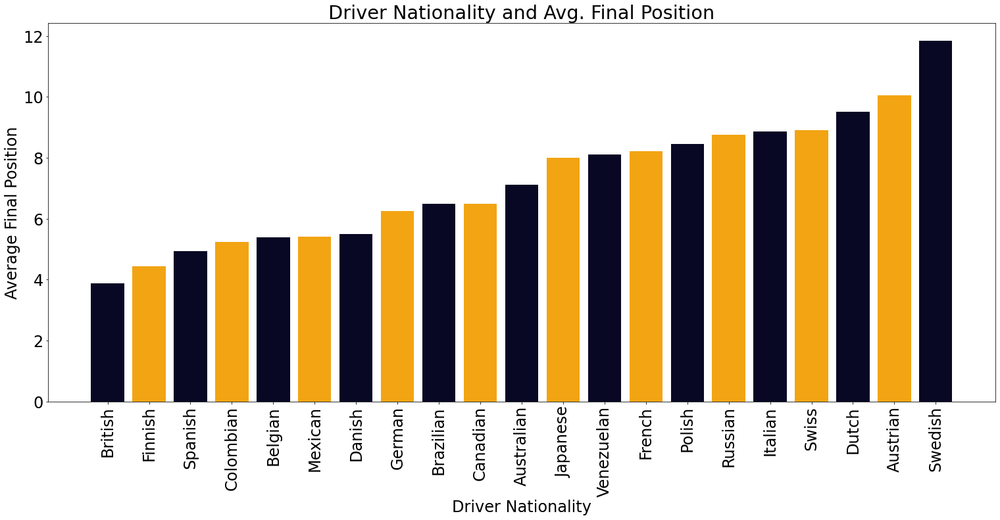

In [ ]:
circ_df = df1.groupby('nationality').mean()
circ_df = circ_df.sort_values('final_position')
circ_df.columns

plt.rcParams.update({'font.size': 24})
master_figsize = (20, 8)

fig = plt.figure(figsize=master_figsize)
ax = fig.add_axes([0,0,1,1])

plt.xlabel('Driver Nationality')
plt.ylabel('Average Final Position')
plt.title('Driver Nationality and Avg. Final Position')
plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees



circuitNameList = df1['nationality'].unique()
avgfastestLap = circ_df['final_position']
ax.bar(circuitNameList,avgfastestLap,color=['#080724', '#f2a413'])
plt.show()

Created a plot on the average final position and lap position which shows the importance of where a driver is placed. If a driver stays within the top 5 lap positions they have a higher chance of being in the top final positions of a race.

(array([ 0.,  2.,  4.,  6.,  8., 10.]),
 <a list of 6 Text major ticklabel objects>)

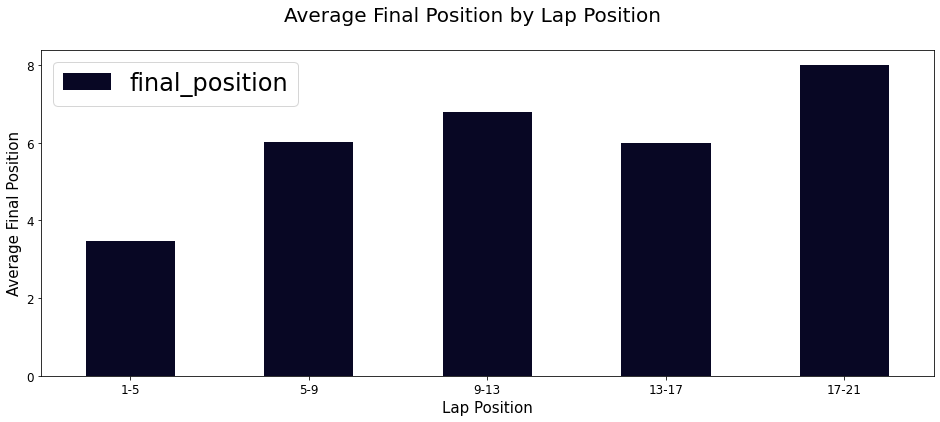

In [ ]:
df['bin'] = pd.cut(df['lap_position'], bins=range(1,24,4), labels=[f'{l}-{l+4}' for l in range(1,20,4)])

mean_pos = df.groupby('bin').mean()

fig = mean_pos.plot(kind='bar',y='final_position',figsize=(16,6), color='#080724')
# mean = df['Weekly_Sales'].mean()
# fig.axhline(mean,color = 'black')


plt.xticks(rotation=360, ha="center")

plt.figsize=(12,8)
plt.xlabel('Lap Position', fontsize=15)
plt.ylabel('Average Final Position', fontsize=15)
plt.suptitle('Average Final Position by Lap Position', fontsize=20)
plt.xticks(fontsize=12) 
plt.yticks(fontsize=12)

Created a plot on the constructor name and final position which shows the importance of constructors depending on a drivers final position. Certain constructers win more consistently than others.

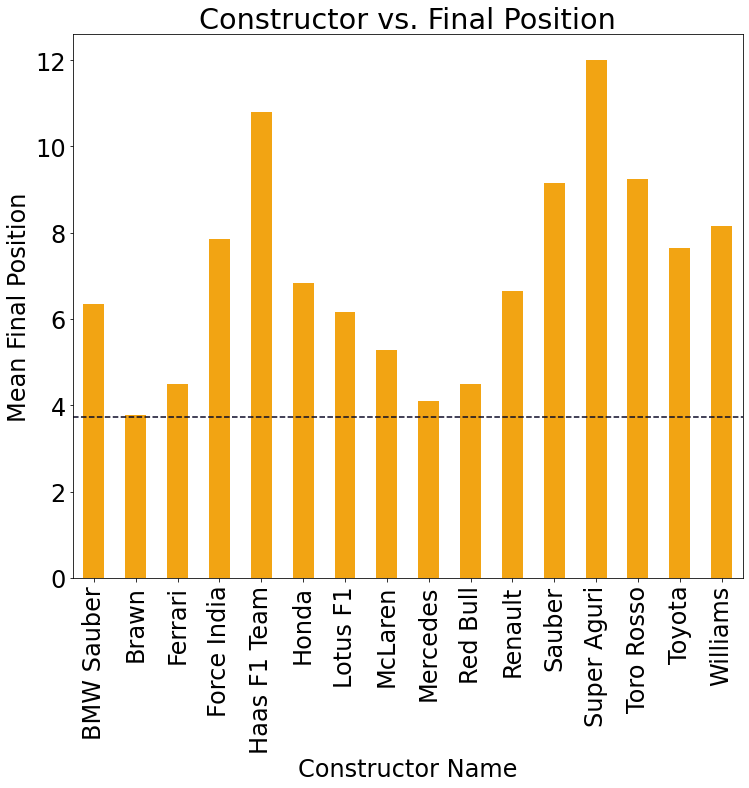

In [ ]:
mean=df['final_position'].mean()
dfg1 = df1.groupby(['constructor_name'])['final_position'].mean()

dfg1.plot(kind='bar', title='Constructor vs. Final Position', ylabel='Mean Final Position',
         xlabel='Constructor Name', figsize=(12, 10), color='#f2a413')
plt.axhline(mean, color='#080724', linestyle='--')

Created a plot on the grid position and final position that shows that the lower the grid position can determined if one will qualify in a races. This is crucial to the success of a driver,  better the grid position the higher the chance a driver will win with a good final position. If a driver is place in the top 5 grid positions they are placed at the start of the race giving a driver a better chance at winning. However, if a driver is in the lower grid positions they will most likely stay at the end of the race.

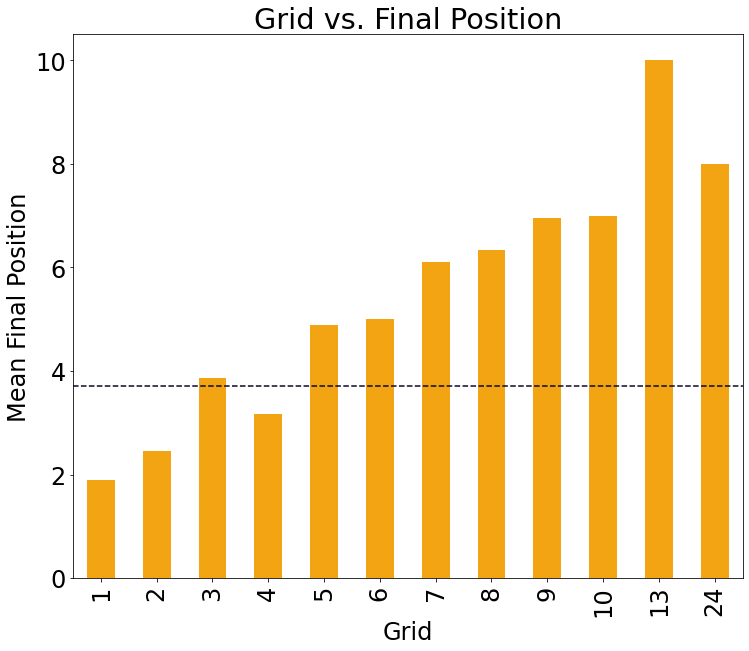

In [ ]:
mean=df['final_position'].mean()
dfg1 = df.groupby(['grid'])['final_position'].mean()

dfg1.plot(kind='bar', title='Grid vs. Final Position', ylabel='Mean Final Position',
         xlabel='Grid', figsize=(12, 10), color='#f2a413')
plt.axhline(mean, color='#080724', linestyle='--')

Plot on the grid position and final position that shows the ranking of a driver based on the previous seasons performance. If a driver is in the top ranked they are awarded more points based on where they placed in a race.

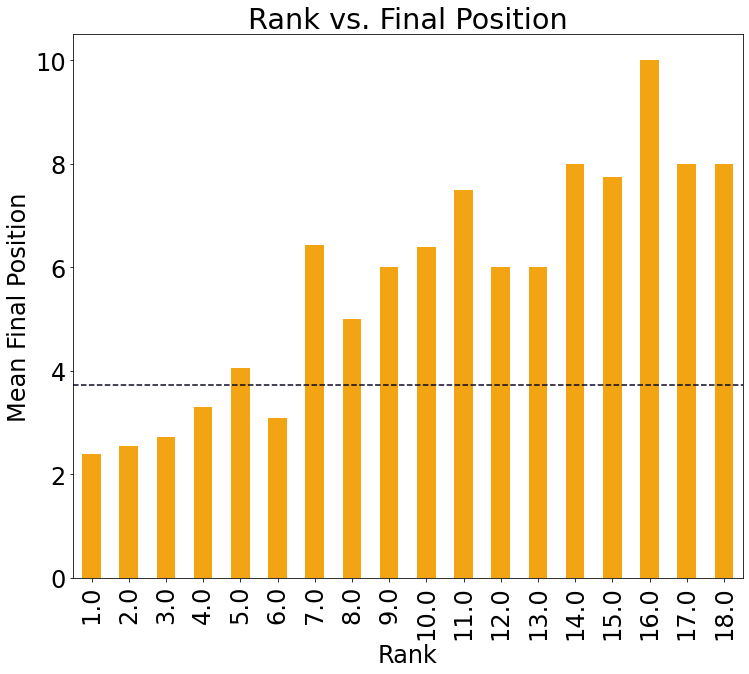

In [ ]:
mean=df['final_position'].mean()
dfg1 = df.groupby(['rank'])['final_position'].mean()

dfg1.plot(kind='bar', title='Rank vs. Final Position', ylabel='Mean Final Position',
         xlabel='Rank', figsize=(12, 10), color='#f2a413')
plt.axhline(mean, color='#080724', linestyle='--')

##Correlation Heat Map

Due to such a big datase, it was decided to check which columns seemed to have more importance based on their definitions and menings to analyze final position.

Using the chosen columns we anylizing the correlation of those columns and final position. 

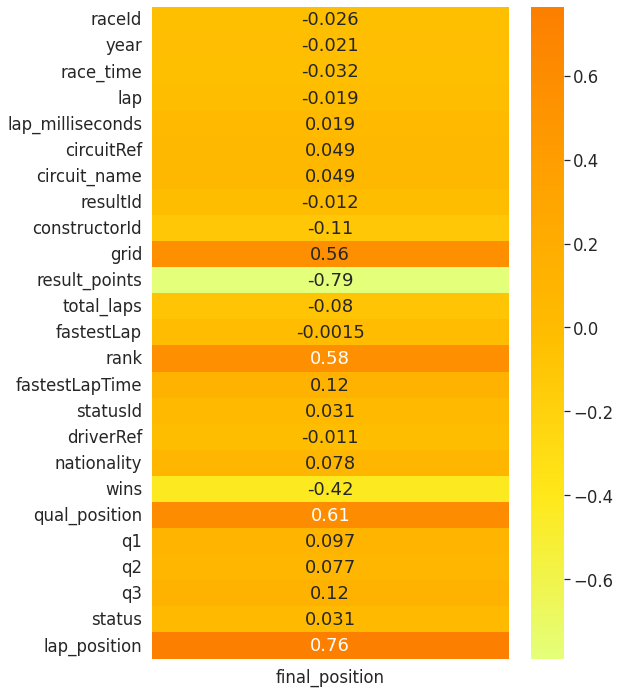

In [ ]:
dd = df.corr().loc[['raceId', 'year', 'race_time', 'lap', 'lap_milliseconds', 'circuitRef', 'circuit_name',
        'resultId', 'constructorId', 'grid','result_points','total_laps', 'fastestLap', 'rank', 'fastestLapTime',
        'statusId', 'driverRef', 'nationality',  'wins', 'qual_position', 'q1', 'q2', 'q3', 'status', 'lap_position'],['final_position']]
plt.subplots(figsize=(8, 12))


sns.set(font_scale = 1.5)
sns.heatmap(dd,annot=True,cmap='Wistia')

##Linear Model

Based on the correlation heatmap, we used most of the columns to creat a train test split of a test size 30% to create a linear model. 

In [ ]:
train_df, test_df = train_test_split(df, test_size=0.3)


X_train = train_df[[ 'year','race_time', 'lap', 'lap_milliseconds',  'circuit_name',
         'constructorId', 'grid','total_laps', 'fastestLap', 'rank', 'fastestLapTime',
         'driverRef', 'nationality',  'wins', 'qual_position', 'q1', 'q2', 'q3', 'status', 'lap_position']]
y_train = train_df['final_position']

X_test = test_df[[ 'year', 'race_time', 'lap', 'lap_milliseconds',  'circuit_name',
         'constructorId', 'grid','total_laps', 'fastestLap', 'rank', 'fastestLapTime',
         'driverRef', 'nationality',  'wins', 'qual_position', 'q1', 'q2', 'q3', 'status', 'lap_position']]
y_test = test_df['final_position']


lr = LinearRegression()

lr.fit(X_train, y_train)

lr.score(X_test, y_test)


0.6732594114229434

In [ ]:
y_pred = lr.predict(X_test)

We found that our linear model gave us a score of 67%, so we looked into the mean square error and mean absolute error of the model. We further used a score model function that gives the mean absolute error as well as plotting our predictions and actual values of the linear model. 

In [ ]:
def score_model(y, y_hat):
  mae_score = mean_absolute_error(y, y_pred3)
  print(f'MAE = {np.round(mae_score, 4)}')

  pearson = np.corrcoef(y, y_hat)[0, 1]
  print(f'R^2 = {np.round(pearson**2, 4)}')
  plt.figure(figsize=(12, 8))
  plt.scatter(y, y_hat, alpha=0.1,  color = '#F2A413', label='Linear Predicted')
  plt.xlabel('Actual',  fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.plot([0,15],[0,15], color = '#080724')
  plt.title('Model Predictions vs Actual Values', fontsize=18);

In [ ]:
print(f'Linear regresion MSE = {mse(y_pred, y_test)}')

Linear regresion MSE = 2.8262329764739182


MAE = 1.1557
R^2 = 0.6733


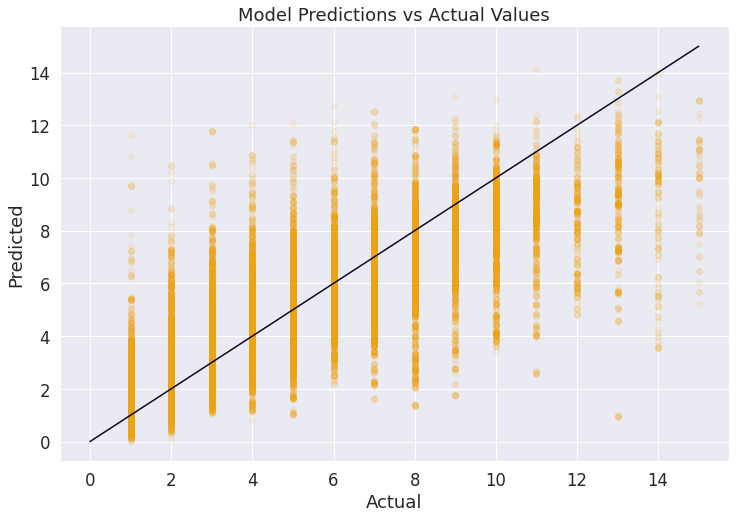

In [ ]:
score_model(y_test,y_pred3)
plt.savefig('Linear_Model_F1')

Since we data engineered columns 'age' and 'is_home', we careted a new correlation heat map on final position adding those columns as well as minimizing some from the previous model. Using the chosen columns we anylizing the correlation of those columns and final position. As it can be seened, the most correlated columns did not changed. 

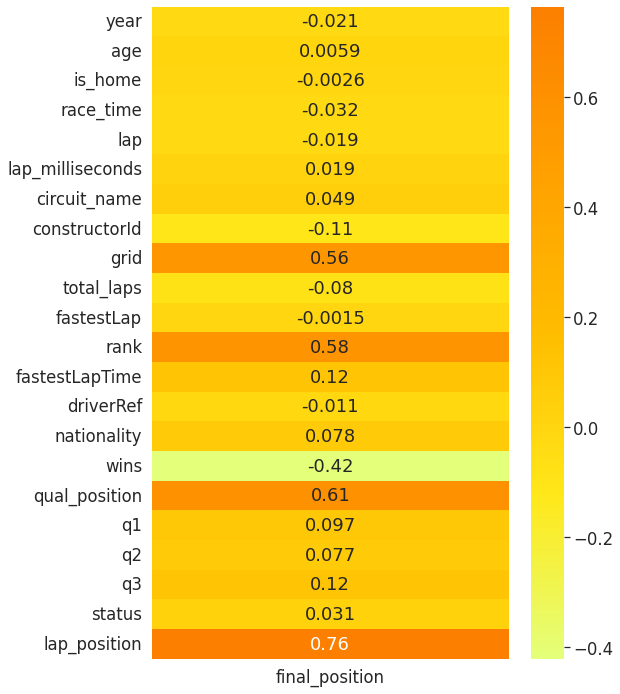

In [ ]:
dd2 = df.corr().loc[['year', 'age', 'is_home', 'race_time', 'lap', 'lap_milliseconds',  'circuit_name',
         'constructorId', 'grid','total_laps', 'fastestLap', 'rank', 'fastestLapTime',
         'driverRef', 'nationality',  'wins', 'qual_position', 'q1', 'q2', 'q3', 'status', 'lap_position'],['final_position']]
plt.subplots(figsize=(8, 12))
sns.set(font_scale = 1.5)
sns.heatmap(dd2,annot=True, cmap='Wistia')

##Decision Tree Model

Created a Decision Tree Model to further investigate the more correlated columns from the heat map. This DEcision Model was done by using both a train test split train size of 60% and train test split with a test size of 50% split for both the validation and test.

In [ ]:
train_df2, test_valid_df2 = train_test_split(df, train_size=0.6)

valid_df2, test_df2 = train_test_split(test_valid_df2, test_size=0.5)


In [ ]:
X_train2 = train_df2[[ 'year', 'age', 'is_home', 'lap_milliseconds',  'circuit_name',
          'grid', 'rank', 'fastestLapTime','fastestLap', 'wins', 'nationality', 
          'nationality',   'qual_position', 'q1', 'q2', 'q3', 'status', 'lap_position']]

y_train2 = train_df2['final_position']

X_test2 = test_df2[[ 'year', 'age', 'is_home', 'lap_milliseconds',  'circuit_name',
          'grid', 'rank', 'fastestLapTime','fastestLap','wins','nationality',
          'nationality',   'qual_position', 'q1', 'q2', 'q3', 'status', 'lap_position']]

y_test2 = test_df2['final_position']

X_valid2 = valid_df2[[ 'year', 'age', 'is_home', 'lap_milliseconds',  'circuit_name',
          'grid', 'rank', 'fastestLapTime','fastestLap','wins', 'nationality',
          'nationality',   'qual_position', 'q1', 'q2', 'q3', 'status', 'lap_position']]

y_valid2 = valid_df2['final_position']

Creating a Decision Tree Regressor that is then fit with the train frame and finding the best hyperparameters for the tree. This is done using Grid Search to find the right specified parameter values that best fit our model.

In [ ]:
dt_reg = DecisionTreeRegressor()
dt_reg.fit(X_train2, y_train2)

In [ ]:
hyperparam_grid = {'min_samples_leaf': [2, 3,4, 5, 10, 15, 20, 30],
                  'max_depth': [2, 3,4, 5, 10, 15, 20, 30],
                  'min_samples_split': [ 2, 3,4,5,10, 15, 20, 30], 'splitter' : ['best', 'random']}

grid_search = GridSearchCV(dt_reg, hyperparam_grid, n_jobs=-1)

grid_search.fit(X_train2, y_train2)

In [ ]:
grid_search.best_params_

Implementing the best fit parameters into our Decision Tree Model and calculating the predicted values.

In [ ]:
dtr_s = DecisionTreeRegressor(max_depth= 30, min_samples_leaf=2, min_samples_split= 4) 

dtr_s.fit(X_train2, y_train2)

pred_dt = dtr_s.predict(X_valid2)

Plotting the Decision Tree Model featuring the names of the columns used in the train test.

In [ ]:
plt.figure(figsize=(250,100))
plot_tree(dtr_s, feature_names=train_df2.columns,fontsize = 13, filled=True, rounded =True);
plt.savefig('Desicion_Tree')

A text representation summary of all the rules in the Decision Tree.

In [ ]:
text_representation2 = tree.export_text(dtr_s)
print(text_representation2)

We found that our Decision Tree Model gave us a score of 95% and further looked into the mean square error and mean absolute error of the model. Further, we plotted our predictions and actual values of the  decision tree model and see a linear trend absed on the final position.

In [ ]:
print(f'Decision tree R^2 = {dtr_s.score(X_valid2, y_valid2)**2}')
print(f'Decision tree MSE = {mse(pred_dt, y_valid2)}')
print(f'Decision tree MAE = {mae(y_valid2, pred_dt)}')

Decision tree 2 R^2 = 0.9536400140955679
Decision tree 2 MSE = 0.20793155938234925


In [ ]:
sns.set(font_scale = 1.5)

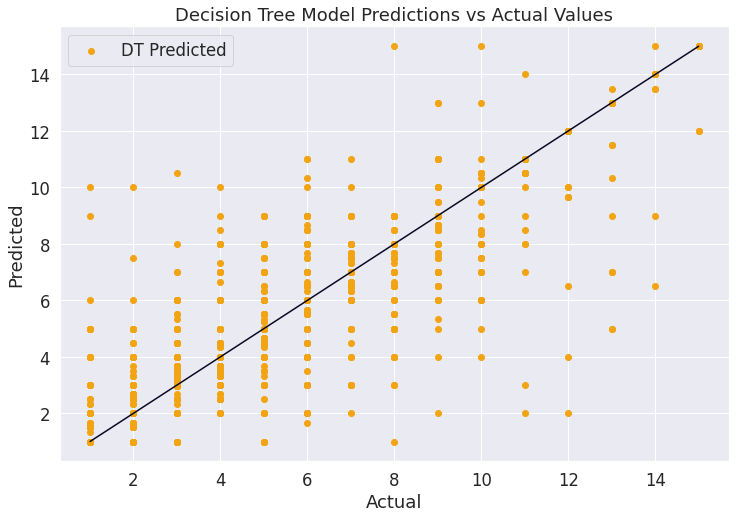

In [ ]:
plt.figure(figsize=(12, 8))
plt.scatter(y_valid2, preds_sF2, alpha=0.1, color = '#F2A413', label='DT Predicted')
plt.xlabel('Actual',  fontsize=18)
plt.ylabel('Predicted', fontsize=18)
plt.plot([1,15], [1,15], linestyle = '-', color = '#080724')
plt.title('Decision Tree Model Predictions vs Actual Values', fontsize=18);
plt.savefig('Decision_Model_F1')
plt.legend();